# RAFT

Explore the RAFT deep network architecture for optical flow.

In [1]:
#!git clone https://github.com/princeton-vl/RAFT.git

Cloning into 'RAFT'...
remote: Enumerating objects: 133, done.
remote: Total 133 (delta 0), reused 0 (delta 0), pack-reused 133
Receiving objects: 100% (133/133), 10.01 MiB | 2.03 MiB/s, done.
Resolving deltas: 100% (47/47), done.


In [2]:
!ls RAFT

LICENSE            chairs_split.txt   download_models.sh train_standard.sh
RAFT.png           core               evaluate.py
README.md          demo-frames        train.py
alt_cuda_corr      demo.py            train_mixed.sh


In [3]:
#!./RAFT/download_models.sh

--2021-10-10 23:20:44--  https://www.dropbox.com/s/4j4z58wuv8o0mfz/models.zip
Resolving www.dropbox.com (www.dropbox.com)... 162.125.64.18
Connecting to www.dropbox.com (www.dropbox.com)|162.125.64.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/4j4z58wuv8o0mfz/models.zip [following]
--2021-10-10 23:20:45--  https://www.dropbox.com/s/raw/4j4z58wuv8o0mfz/models.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc318aacafdcbb3b8c8c52c44be9.dl.dropboxusercontent.com/cd/0/inline/BXypZoeVAO5-fNmQl91LxbvOk6P9L8QGFu-vGCSEz7LPd3BigMZPRuDFhVZez1flxhMTKFCf5p_jDvW9-HsZWTsAXGq0ERla7c0ftSOLlxdqyG7TMXZY3Pw4QTlX1msLDZG-G3Hy1K92HuRJU-Warv7C/file# [following]
--2021-10-10 23:20:45--  https://uc318aacafdcbb3b8c8c52c44be9.dl.dropboxusercontent.com/cd/0/inline/BXypZoeVAO5-fNmQl91LxbvOk6P9L8QGFu-vGCSEz7LPd3BigMZPRuDFhVZez1flxhMTKFCf5p_jDvW9-HsZWTsAXGq0ERla7c0ftSOLlxdqyG7TMXZY3Pw4QT

In [4]:
#!wget https://thinkautonomous-raft.s3.eu-west-3.amazonaws.com/raft_data.zip && unzip raft_data.zip && rm raft_data.zip

--2021-10-10 23:21:38--  https://thinkautonomous-raft.s3.eu-west-3.amazonaws.com/raft_data.zip
Resolving thinkautonomous-raft.s3.eu-west-3.amazonaws.com (thinkautonomous-raft.s3.eu-west-3.amazonaws.com)... 52.95.156.64
Connecting to thinkautonomous-raft.s3.eu-west-3.amazonaws.com (thinkautonomous-raft.s3.eu-west-3.amazonaws.com)|52.95.156.64|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 51891206 (49M) [application/zip]
Saving to: ‘raft_data.zip’

raft_data.zip       100%[===================>]  49.49M  2.64MB/s    in 32s     

2021-10-10 23:22:10 (1.55 MB/s) - ‘raft_data.zip’ saved [51891206/51891206]

Archive:  raft_data.zip
  inflating: 0000000148.png          
  inflating: __MACOSX/._0000000148.png  
  inflating: 0000000149.png          
  inflating: __MACOSX/._0000000149.png  
  inflating: update.py               
  inflating: __MACOSX/._update.py    
  inflating: raft.py                 
  inflating: __MACOSX/._raft.py      
  inflating: coco.names      

In [5]:
!mv raft.py RAFT/core/raft.py 

In [6]:
!mv update.py RAFT/core/update.py

# Run RAFT on 2 images

In [7]:
import sys
sys.path.append('RAFT/core')
from raft import RAFT
from utils import flow_viz
from utils.utils import InputPadder
from collections import OrderedDict
import os
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
from utils import flow_viz

In [8]:
def bgr2rgb(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [9]:
def frame_preprocess(frame, device):
    frame = torch.from_numpy(frame).permute(2, 0, 1).float()
    frame = frame.unsqueeze(0)
    frame = frame.to(device)
    return frame

In [10]:
def get_cpu_model(model):
    new_model = OrderedDict()
    # get all layer's names from model
    for name in model:
        # create new name and update new model
        new_name = name[7:]
        new_model[new_name] = model[name]
    return new_model

In [11]:
def load_model(weights_path):
    model = RAFT()
    pretrained_weights = torch.load(weights_path, map_location=torch.device("cpu"))
    if torch.cuda.is_available():
        device = "cuda"
        # parallel between available GPUs
        model = torch.nn.DataParallel(model)
        # load the pretrained weights into model
        model.load_state_dict(pretrained_weights)
        model.to(device)
    else:
        device = "cpu"
        # change key names for CPU runtime
        pretrained_weights = get_cpu_model(pretrained_weights)
        # load the pretrained weights into model
        model.load_state_dict(pretrained_weights)
    return model

In [12]:
def inference_imgs(model, frame_1, frame_2):
    
    # change model's mode to evaluation
    model.eval()
    device="cuda" if torch.cuda.is_available() else "cpu"

    with torch.no_grad():
        # Read images
        frame_1 = frame_preprocess(frame_1, device)
        frame_2 = frame_preprocess(frame_2, device)
        # preprocessing
        padder = InputPadder(frame_1.shape, mode="kitti")
        frame_1, frame_2 = padder.pad(frame_1, frame_2)

        # predict the flow
        flow_low, flow_up = model(frame_1, frame_2, iters=12, test_mode=True)

        # transform to image
        flo = flow_up[0].permute(1,2,0).cpu().numpy()
        flo = flow_viz.flow_to_image(flo)
    return flow_up, flo

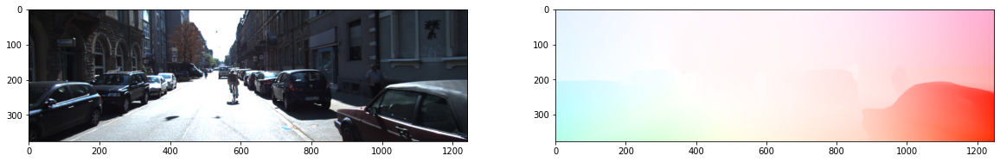

In [13]:
img_1 = cv2.imread("0000000148.png")
img_2 = cv2.imread("0000000149.png")
model = load_model("models/raft-kitti.pth")

flow_up, flo = inference_imgs(model, img_1, img_2)

f, (ax0, ax1) = plt.subplots(1,2, figsize=(20,10))
ax0.imshow(bgr2rgb(img_1))
ax1.imshow(flo)
plt.show()

# Understand the Output

In [14]:
print(flow_up.shape)
print(flow_up[0][0])
print(flow_up[0][0].shape)

torch.Size([1, 2, 376, 1248])
tensor([[-24.2941, -24.2858, -24.2594,  ...,  78.4013,  78.3164,  78.3624],
        [-24.3086, -24.2478, -24.1999,  ...,  78.4617,  78.4067,  78.3907],
        [-24.2412, -24.2050, -24.1523,  ...,  78.5320,  78.4603,  78.5028],
        ...,
        [-69.1606, -68.9178, -68.8136,  ..., 235.8236, 236.5262, 237.6762],
        [-69.2194, -68.9902, -68.8256,  ..., 236.7662, 237.4553, 238.5614],
        [-69.2169, -69.0700, -68.9426,  ..., 237.5907, 238.5533, 239.3780]])
torch.Size([376, 1248])


# Run an Object Detection algorithm to identify individual objects

In [23]:
from yolov4.tf import YOLOv4
import tensorflow as tf
import time

In [26]:
yolo = YOLOv4(tiny=True)
yolo.classes = "coco.names"
yolo.make_model()
yolo.load_weights("yolov4-tiny.weights", weights_type="yolo")

def run_obstacle_detection(img):
    start_time=time.time()
    
    #img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    resized_image = yolo.resize_image(img)
    
    # 0 ~ 255 to 0.0 ~ 1.0
    resized_image = resized_image / 255.
    
    #input_data == Dim(1, input_size, input_size, channels)
    input_data = resized_image[np.newaxis, ...].astype(np.float32)

    candidates = yolo.model.predict(input_data)

    _candidates = []
    result = img.copy()
    for candidate in candidates:
        batch_size = candidate.shape[0]
        grid_size = candidate.shape[1]
        _candidates.append(tf.reshape(candidate, shape=(1, grid_size * grid_size * 3, -1)))
        
        #candidates == Dim(batch, candidates, (bbox))
        candidates = np.concatenate(_candidates, axis=1)
        
        #pred_bboxes == Dim(candidates, (x, y, w, h, class_id, prob))
        pred_bboxes = yolo.candidates_to_pred_bboxes(candidates[0], iou_threshold=0.35, score_threshold=0.40)
        pred_bboxes = pred_bboxes[~(pred_bboxes==0).all(1)] #https://stackoverflow.com/questions/35673095/python-how-to-eliminate-all-the-zero-rows-from-a-matrix-in-numpy?lq=1
        pred_bboxes = yolo.fit_pred_bboxes_to_original(pred_bboxes, img.shape)
        exec_time = time.time() - start_time
        
        #print("time: {:.2f} ms".format(exec_time * 1000))
        result = yolo.draw_bboxes(img, pred_bboxes)
        
    return result, pred_bboxes

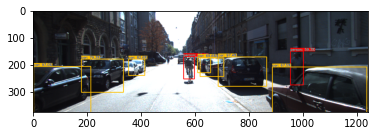

In [27]:
result, pred_bboxes = run_obstacle_detection(bgr2rgb(img_1))

plt.imshow(result)
plt.show()

# Evaluate the Motion of each obstacle through time

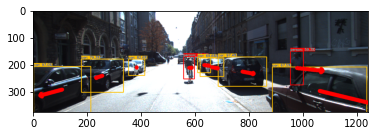

In [28]:
def add_arrow_to_box(result, pred_bboxes, fl_vectors):
    h, w, _ = result.shape
    image_arr = []
    
    for box in pred_bboxes:
        center_x = int(box[0]*w)
        center_y = int(box[1]*h)
        width_box_2 = int(box[2]*w/2)
        height_box_2 = int(box[3]*h/2)

        box_x1 = int(center_x - width_box_2)
        box_y1 = int(center_y - height_box_2)
        box_x2 = int(center_x + width_box_2)
        box_y2 = int(center_y + height_box_2)

        flows_u = fl_vectors[0][0][box_y1:box_y2,box_x1:box_x2]
        mean_u = flows_u.mean()
        flows_v = fl_vectors[0][1][box_y1:box_y2,box_x1:box_x2]
        mean_v  =flows_v.mean()
        
        image_arr = cv2.arrowedLine(result, 
                                    (center_x,center_y), 
                                    (center_x + int(mean_u)*2,center_y+int(mean_v)*2), 
                                    (255,0,0), 13)
        
    return image_arr

image_arr = add_arrow_to_box(result, pred_bboxes, flow_up)
plt.imshow(image_arr)
plt.show()

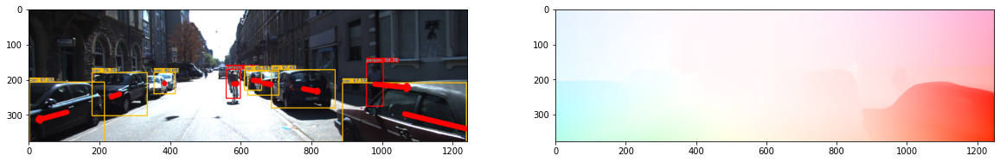

In [29]:
f, (ax0, ax1)= plt.subplots(1, 2, figsize=(20,10))
ax0.imshow(image_arr)
ax1.imshow(flo)
plt.show()

In [30]:
print(flo.shape)
print(image_arr.shape)

(376, 1248, 3)
(375, 1242, 3)


# Run on a Video

In [33]:
def inference_video(video_path):
    model = load_model("models/raft-kitti.pth")
    
    # change model's mode to evaluation
    model.eval()
    
    # capture the video and get the first frame
    cap = cv2.VideoCapture(video_path)
    ret, cap1 = cap.read()
    video_frames_arrow = []
    video_frames_flow = []

    with torch.no_grad():
        while True:
            # read the next frame
            ret, cap2 = cap.read()
            if not ret:
                break
            
            # Predict the Flow
            flow_up, flo = inference_imgs(model, cap1.copy(), cap2.copy())
            
            # Run obstacle Detection
            result, pred_bboxes = run_obstacle_detection(bgr2rgb(cap2))
            
            # Add Motion Prediction
            image_arr = bgr2rgb(add_arrow_to_box(result, pred_bboxes, flow_up))
            video_frames_arrow.append(image_arr)
            video_frames_flow.append(flo)
            
            # mode forward one frame
            cap1 = cap2
            
    return video_frames_arrow, video_frames_flow

In [34]:
video_frames_arrow, video_frames_flow = inference_video("kitti_3.mp4")

In [35]:
out = cv2.VideoWriter("output_flow.mp4",
                      cv2.VideoWriter_fourcc(*'mp4v'), 
                      15.0, 
                      (video_frames_flow[0].shape[1] ,video_frames_flow[0].shape[0])
                     )

for i in range(len(video_frames_flow)):
    out.write(video_frames_flow[i].astype(np.uint8))

out.release()

In [36]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open('output_flow.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML("""
<video width=800 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [37]:
out = cv2.VideoWriter("output_arrow.mp4",
                      cv2.VideoWriter_fourcc(*'mp4v'), 
                      15.0, 
                      (video_frames_arrow[0].shape[1] ,video_frames_arrow[0].shape[0])
                     )

for i in range(len(video_frames_arrow)):
    out.write(video_frames_arrow[i].astype(np.uint8))

out.release()

In [38]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open('output_arrow.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML("""
<video width=800 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

# Legacy

In [39]:
def inference():
    # Outputs to return
    result_flows_vectors = []
    result_flows_images = []
    images = []

    # Get the RAFT model
    model = RAFT()

    # Load pretrained weights
    pretrained_weights = torch.load("models/raft-kitti.pth", map_location=torch.device("cpu"))

    if torch.cuda.is_available():
        device = "cuda"
        # parallel between available GPUs
        model = torch.nn.DataParallel(model)
        # load the pretrained weights into model
        model.load_state_dict(pretrained_weights)
        model.to(device)
    else:
        device = "cpu"
        # change key names for CPU runtime
        pretrained_weights = get_cpu_model(pretrained_weights)
        # load the pretrained weights into model
        model.load_state_dict(pretrained_weights)

    # change model's mode to evaluation
    model.eval()

    video_path = "kitti_3.mp4"

    # capture the video and get the first frame
    cap = cv2.VideoCapture(video_path)
    ret, frame_1 = cap.read()

    # Save the image
    images.append(cv2.cvtColor(frame_1, cv2.COLOR_BGR2RGB))

    # frame preprocessing
    frame_1 = frame_preprocess(frame_1, device)

    counter = 0
    with torch.no_grad():
        while True:
            # read the next frame
            ret, frame_2_b = cap.read()
            if not ret:
                break
                
            # save the image
            images.append(cv2.cvtColor(frame_2_b, cv2.COLOR_BGR2RGB))
            
            # preprocessing
            frame_2_b = frame_preprocess(frame_2_b, device)
            padder = InputPadder(frame_1.shape, mode="kitti")
            frame_1, frame_2 = padder.pad(frame_1, frame_2_b)
            
            # predict the flow
            flow_low, flow_up = model(frame_1, frame_2, iters=12, test_mode=True)
            
            # save the flow
            result_flows_vectors.append(flow_up.cpu().detach().numpy())
            
            # transform to image
            flo = flow_up[0].permute(1,2,0).cpu().numpy()
            flo = flow_viz.flow_to_image(flo)
            
            # save the image
            result_flows_images.append(flo)
            
            # mode forward one frame
            frame_1 = frame_2_b    
            
    return result_flows_vectors, result_flows_images, images

In [40]:
fl_vectors, fl_images, images = inference()

In [41]:
final_vid = []

for idx, img in enumerate(images):
    if idx != 0:
        # Run an Object Detection Algorithm
        result, pred_bboxes = run_obstacle_detection(img)

        if len(pred_bboxes)>0:
            #If we have boxes, get the Optical Flow we ran before
            fl_vec = fl_vectors[idx-1]
            fl_out = cv2.resize(add_arrow_to_box(result, pred_bboxes, fl_vec), (1248,376))
            fl_img = fl_images[idx-1]
            img_final = np.concatenate([fl_out, fl_img], axis=0)
            
        final_vid.append(img_final)
        out = cv2.VideoWriter("output.mp4",cv2.VideoWriter_fourcc(*'mp4v'), 15.0, (fl_out.shape[1] ,fl_out.shape[0]))
        
        for i in range(len(final_vid)):
            out.write(final_vid[i].astype(np.uint8))
            
        out.release()

# References
* Teed, Z. and Deng, J., 2020. [Raft: Recurrent all-pairs field transforms for optical flow](https://arxiv.org/pdf/2003.12039.pdf). In European conference on computer vision (pp. 402-419). Springer, Cham.